<a href="https://colab.research.google.com/github/Fillipe16/SigmaGeek/blob/main/Aprendizagem_Adaptativa/ClassificacaoAcertoAluno.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
flag_pip = False
if(flag_pip):
  !pip install dython
  !python -m pip uninstall matplotlib
  !pip install matplotlib==3.1.3

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from dython.nominal import associations
from statsmodels.graphics.tsaplots import plot_acf
import statsmodels.api as sm

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import classification_report, confusion_matrix


# 1-) Leitura dos Dados

In [ ]:
path = '/content/drive/MyDrive/Desafios - SIGMAGEEK/QCONCURSOS/dados'

dataset = pd.read_csv(path+"/Dataset_model.csv")
display(dataset)
display(dataset.info())

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (9,10,12) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,gp:college type,...,institute_id,knowledge_area_id,modality_id,nullified,outdated,product_id,publication_year,right_answer,scholarity_id,novo_question_id
0,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,4126.0,13.0,1.0,0.0,0.0,1.0,2022.0,A,2.0,489400
1,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,4126.0,13.0,1.0,0.0,0.0,1.0,2022.0,C,2.0,489399
2,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,4126.0,13.0,1.0,0.0,0.0,1.0,2022.0,D,2.0,489398
3,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,4126.0,13.0,1.0,0.0,0.0,1.0,2022.0,A,2.0,489397
4,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,4126.0,13.0,1.0,0.0,0.0,1.0,2022.0,E,2.0,489396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999995,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,6901.0,27.0,1.0,0.0,0.0,1.0,2019.0,A,3.0,433505
1999996,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,6901.0,27.0,1.0,0.0,0.0,1.0,2019.0,A,3.0,432606
1999997,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,6901.0,27.0,1.0,0.0,0.0,1.0,2019.0,B,3.0,432605
1999998,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,3270.0,27.0,1.0,0.0,0.0,1.0,2019.0,B,3.0,430934


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 0 to 1999999
Data columns (total 32 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   novo_user_id            int64  
 1   city                    object 
 2   country                 object 
 3   device                  object 
 4   device_type             object 
 5   os                      object 
 6   platform                object 
 7   region                  object 
 8   gp:carrers              object 
 9   gp:college type         object 
 10  gp:degree course        object 
 11  gp:previous experience  object 
 12  gp:school type          object 
 13  gp:segment              object 
 14  gp:source_project       object 
 15  acertou                 int64  
 16  created_at              object 
 17  row                     int64  
 18  commented_by_professor  float64
 19  difficulty              float64
 20  discipline_id           float64
 21  examining_board_id      float64

None

In [ ]:
dataset['acertou']

0          0
1          0
2          1
3          0
4          1
          ..
1999995    1
1999996    1
1999997    0
1999998    0
1999999    0
Name: acertou, Length: 2000000, dtype: int64

# 2-) Análise Exploratória de Dados

## 2.1-) Alunos

In [ ]:
# Recorte do dataset apenas com as colunas que descrevem o aluno

colunas_alunos = ['novo_user_id', 'city', 'country', 'device', 'device_type', 'os',
       'platform', 'region', 'gp:carrers', 'gp:college type',
       'gp:degree course', 'gp:previous experience', 'gp:school type',
       'gp:segment', 'gp:source_project']

alunos_df = dataset.loc[:,colunas_alunos]
alunos_df.drop_duplicates(subset=colunas_alunos,inplace=True)
alunos_df.reset_index(inplace=True)

acerto_pesado = (dataset['acertou']*dataset['difficulty']).to_frame()
acerto_pesado['user'] = dataset['novo_user_id']

qtd_difficulty = dataset.groupby(['novo_user_id','difficulty']).difficulty.count().to_frame().rename(columns = {'difficulty':'qtd_diff'}).reset_index()
qtd_difficulty = qtd_difficulty.pivot(index='novo_user_id',columns='difficulty',values='qtd_diff')
alunos_df['taxa_acerto'] = acerto_pesado.groupby('user')[0].sum().values.reshape((20000,1))/dataset.loc[:,['novo_user_id','difficulty']].groupby('novo_user_id').sum().values
qtd_diff_columns = ['diff_'+str(diff) for diff in qtd_difficulty.columns]
alunos_df[qtd_diff_columns] = qtd_difficulty.values
alunos_df.loc[:,qtd_diff_columns] = alunos_df.loc[:,qtd_diff_columns].fillna(value=0)
alunos_df.describe(include='all')

,index,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,...,gp:previous experience,gp:school type,gp:segment,gp:source_project,taxa_acerto,diff_1.0,diff_2.0,diff_3.0,diff_4.0,diff_5.0
count,2.000000e+04,20000.000000,18576,19868,19284,18368,19868,19868,19863,18831,...,9478,25,19648,19620,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000
unique,NaN,NaN,1799,18,217,394,231,3,50,1451,...,4,6,4,2,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Brasília,Brazil,Windows,Windows,Chrome 103,Web,Sao Paulo,Policial,...,beginner,"[""Escola Pública""]",Concurso Público,odin,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,1673,19836,11396,11396,4829,15972,2517,4867,...,5462,11,18898,17285,NaN,NaN,NaN,NaN,NaN,NaN
mean,9.999500e+05,10000.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.596325,32.025050,40.21300,23.291750,4.276400,0.062350
std,5.773647e+05,5773.647028,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.127716,14.369563,7.96643,10.815816,4.129099,0.377186
min,0.000000e+00,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.101852,0.000000,0.00000,0.000000,0.000000,0.000000
25%,4.999750e+05,5000.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.510406,21.000000,35.00000,15.000000,1.000000,0.000000
50%,9.999500e+05,10000.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.597497,31.000000,40.00000,22.000000,3.000000,0.000000
75%,1.499925e+06,15000.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.683417,42.000000,45.00000,30.000000,6.000000,0.000000


Insights:
*   Elevado numero de labels em device, device_type, os e gp:carrers
*   Altissimo numero de valores faltante em: gp:college type, gp:degree course gp:school type. Apreciavel valor faltante em gp:previous expirience







### Analise Pontual: Carreiras

In [ ]:
# Criação de carreiras para cada aluno
carreiras = alunos_df['gp:carrers'].apply(lambda c:str(c).split(',')).explode().str.strip()
carreiras[carreiras == 'Exercito'] = 'Exército' # Limpeza dos dados
carreiras['nan'] = np.nan
alunos_df['carreiras'] = carreiras[~carreiras.index.duplicated(keep='first')]


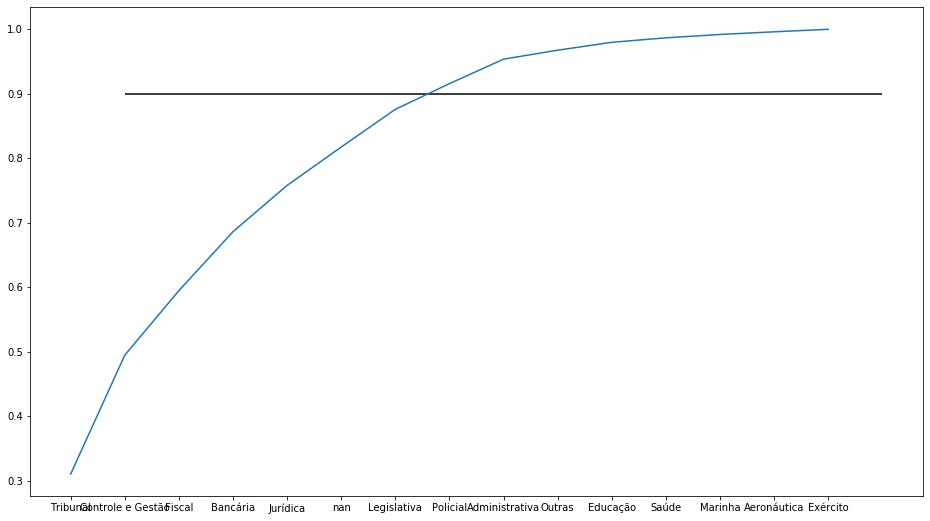

In [ ]:
#Seleção das carreiras

fig,ax = plt.subplots(1,1,figsize=(16,9))
carreiras_unique = carreiras[~carreiras.index.duplicated(keep='first')]

sns.lineplot(x =  carreiras_unique.unique(), 
             y = (carreiras_unique.value_counts(dropna=False).values/carreiras_unique.value_counts(dropna=False).values.sum()).cumsum(),ax=ax)
ax.hlines(y = 0.9,xmin=1,xmax=15)

In [ ]:
#Inserção das carreiras no dataset do aluno
carreiras_selecionadas = ['Tribunal','Controle e Gestão','Fiscal','Bancária','Jurídica','Legislativa','Policial']
carreiras[~carreiras.isin(carreiras_selecionadas)] = 'Outras'
alunos_df['carreiras'] = carreiras[~carreiras.index.duplicated(keep='first')]

### Analise Pontual: Cidades

In [ ]:
#Seleção das carreiras

cidades_count = alunos_df.city.value_counts()
qtd_city_select = ((cidades_count/cidades_count.sum()).cumsum()<0.5).sum()
print(qtd_city_select)

21


In [ ]:
cidades_select = cidades_count[:qtd_city_select].index
#Inserção das cidades no dataset do aluno
cidades = alunos_df.city
cidades[~cidades.isin(cidades_select)] = 'Outras'
alunos_df['cidades'] =  cidades
alunos_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,index,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,...,gp:segment,gp:source_project,taxa_acerto,diff_1.0,diff_2.0,diff_3.0,diff_4.0,diff_5.0,carreiras,cidades
0,0,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",...,Concurso Público,ils,0.501976,13.0,33.0,42.0,12.0,0.0,Tribunal,Rio de Janeiro
1,100,2,São Paulo,Brazil,Windows,Windows,Chrome 104,Web,Sao Paulo,Tribunal,...,Concurso Público,odin,0.625616,25.0,49.0,24.0,2.0,0.0,Tribunal,São Paulo
2,200,3,Outras,Brazil,Apple iPhone,Apple iPhone 11,ios 15.5,iOS,Minas Gerais,"Controle e Gestão, Outras, Administrativa",...,Concurso Público,ils,0.735751,36.0,39.0,21.0,4.0,0.0,Controle e Gestão,Outras
3,300,4,Recife,Brazil,Windows,Windows,Chrome 104,Web,Pernambuco,"Fiscal, Tribunal, Policial, Legislativa, Jurídica",...,Concurso Público,odin,0.773973,63.0,29.0,7.0,1.0,0.0,Fiscal,Recife
4,400,5,Brasília,Brazil,Windows,Windows,Chrome 99,Web,Federal District,Bancária,...,Concurso Público,odin,0.349020,14.0,27.0,49.0,10.0,0.0,Bancária,Brasília
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,1999500,19996,Brasília,Brazil,Windows,Windows,Chrome 104,Web,Federal District,Policial,...,Concurso Público,odin,0.502392,34.0,34.0,21.0,11.0,0.0,Policial,Brasília
19996,1999600,19997,São Luís,Brazil,Samsung Phone,Samsung Galaxy J4 Core,android 8.1.0,Android,Maranhao,Policial,...,Concurso Público,odin,0.475806,9.0,41.0,44.0,5.0,1.0,Policial,São Luís
19997,1999700,19998,Salvador,Brazil,Windows,Windows,Chrome 104,Web,Bahia,Administrativa,...,Concurso Público,odin,0.640693,22.0,36.0,31.0,11.0,0.0,Outras,Salvador
19998,1999800,19999,Outras,Brazil,Samsung Phone,Samsung Galaxy M51,android 12,Android,Alagoas,Administrativa,...,Concurso Público,odin,0.662162,68.0,20.0,8.0,4.0,0.0,Outras,Outras


In [ ]:
# Distribuição Geografica dos alunos

pais = alunos_df.groupby("country").novo_user_id.count().to_frame().reset_index()
estados = alunos_df[alunos_df.country=='Brazil'].groupby("region").novo_user_id.count().to_frame().reset_index()

display(pais)
fig = px.pie(estados,names = 'region',values = "novo_user_id")
fig.show()

,country,novo_user_id
0,Angola,1
1,Argentina,2
2,Australia,2
3,Bolivia,1
4,Brazil,19836
5,Canada,1
6,Colombia,1
7,Denmark,1
8,France,1
9,Germany,1


Insights:
  *   Quase a totalidade dos alunos são do brasil: Possivel descarte dos estrangeiros, pela elevada assimetria.
  *   Boa distribuição dos alunos pelos estados: Elevado numero de labels, talvez agrupamento em regiões(Sudeste, Nordeste, Sul e etc)



In [ ]:
# Análise do uso das plataformas pelos usuários

platform = alunos_df.groupby("platform").novo_user_id.count()

px.bar(platform)

Insights:
  *   Maior utilização de plataformas online.




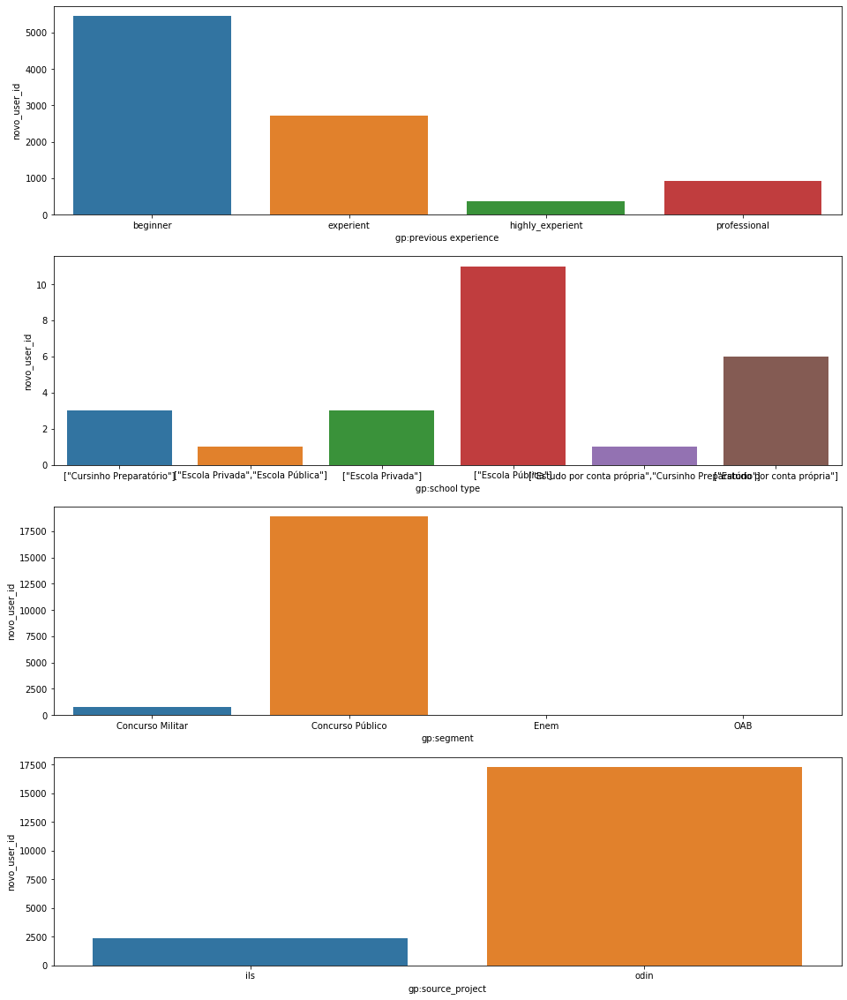

In [ ]:
colunas_gp = ["gp:previous experience","gp:school type","gp:segment","gp:source_project"]

fig, ax = plt.subplots(len(colunas_gp),1,figsize=(16,5*len(colunas_gp)))

for i in range(0,len(colunas_gp)):
  coluna = alunos_df.groupby(colunas_gp[i]).novo_user_id.count().to_frame().reset_index()
  sns.barplot(data = coluna,x=colunas_gp[i], y = "novo_user_id" ,ax=ax[i])
fig.show()

Insights:

  *   Alta assimetria em gp:segment e gp:source_project
  *   Boa distribuição em gp:previous experience



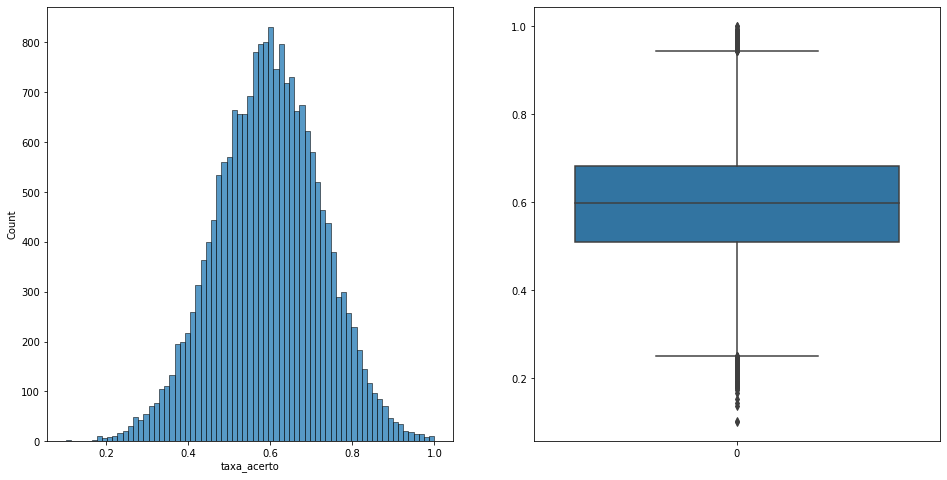

In [ ]:
# distribuição da taxa de acerto

fig,ax = plt.subplots(1,2,figsize = (16,8))
sns.histplot(data = alunos_df['taxa_acerto'], ax=ax[0])
sns.boxplot(data = alunos_df['taxa_acerto'], ax=ax[1])

Insights:
*   Segue distribuição normal
*   Poucos outliers: Possivel Retirada desses alunos(analisar!)
*   A média mostra que a maioria dos alunos erra mais do que acerta





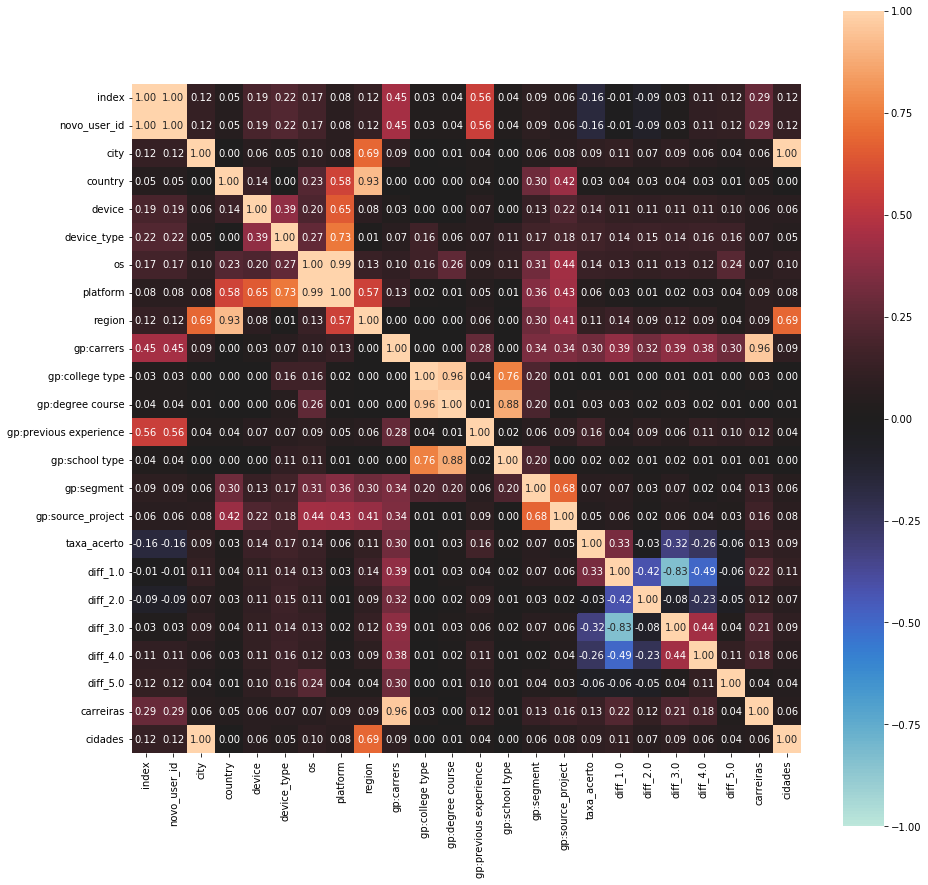

In [ ]:
# Correlação linear entre as variaveis categoricas

associations(alunos_df,figsize=(15, 15))
fig.show()

Insights:

*   Altissimo grau de correlação faz com que sejam a mesa variavel:
    os e platform ; gp:college-type epg:degree course ; degree course e gp:school type
*   As variaveis que tem correlação com taxa_acerto apresentam cardinalidade elevada.( talvez realizar a clusterização usando essas variaveis)







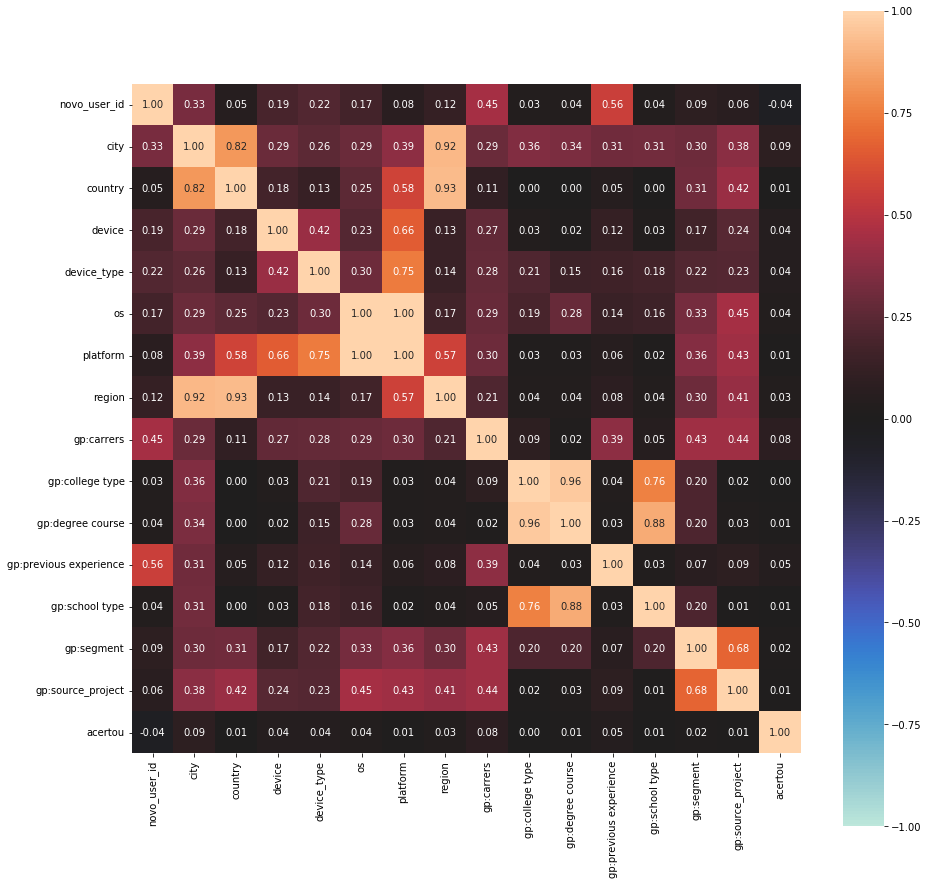

In [ ]:
associations(dataset[colunas_alunos+['acertou']],figsize=(15, 15))
fig.show()

## 2.2-) Questões

In [ ]:
# Filtrando as questões distintas e suas caracteristicas

colunas_questoes = ['created_at', 'row',
       'commented_by_professor', 'difficulty', 'discipline_id',
       'examining_board_id', 'institute_id', 'knowledge_area_id',
       'modality_id', 'nullified', 'outdated', 'product_id',
       'publication_year', 'scholarity_id', 'novo_question_id','acertou']

questions_df = dataset.loc[:,colunas_questoes]
questions_df.drop_duplicates(subset="novo_question_id",inplace=True)

subject_df = pd.read_csv(path+'/subjects_questions.csv')
questions_df = questions_df.merge(right=subject_df,how='left',on='novo_question_id')

questions_df.describe(include='all')

,created_at,row,commented_by_professor,difficulty,discipline_id,examining_board_id,institute_id,knowledge_area_id,modality_id,nullified,outdated,product_id,publication_year,scholarity_id,novo_question_id,acertou,subject_id
count,1083762,1.083762e+06,1.083652e+06,1.081999e+06,1.083652e+06,1.083645e+06,1.083645e+06,1.083652e+06,1.083652e+06,1.083652e+06,1.083652e+06,1.083652e+06,1.083639e+06,1.083652e+06,1.083762e+06,1.083762e+06,1.072102e+06
unique,491746,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,2022-04-12 04:14:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,5.137390e+01,3.323521e-01,2.117572e+00,8.862292e+01,2.276601e+02,4.520364e+03,2.106779e+01,1.183692e+00,3.979137e-03,1.897288e-02,1.332387e+00,2.015876e+03,2.649775e+00,2.495533e+05,6.215414e-01,1.453005e+04
std,NaN,2.876055e+01,4.710567e-01,8.751698e-01,1.299735e+02,3.684692e+02,2.828613e+03,3.984143e+01,3.872328e-01,6.295480e-02,1.364292e-01,1.234178e+00,4.015810e+00,5.302301e-01,1.441938e+05,4.850030e-01,6.714952e+03
min,NaN,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+03,1.000000e+00,1.000000e+00,0.000000e+00,5.000000e+00
25%,NaN,2.700000e+01,0.000000e+00,1.000000e+00,3.000000e+00,2.000000e+00,1.484000e+03,9.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.013000e+03,2.000000e+00,1.243180e+05,0.000000e+00,1.434700e+04
50%,NaN,5.200000e+01,0.000000e+00,2.000000e+00,2.000000e+01,1.210000e+02,5.773000e+03,1.300000e+01,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.017000e+03,3.000000e+00,2.505830e+05,1.000000e+00,1.616100e+04
75%,NaN,7.600000e+01,1.000000e+00,3.000000e+00,1.720000e+02,2.520000e+02,6.281000e+03,1.500000e+01,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.019000e+03,3.000000e+00,3.744818e+05,1.000000e+00,1.893700e+04


Insights:

  *   Variaveis com muitos valores discretos, que estão referenciando classes:
    discipline_id ,examining_board_id, institute_id, knowledge_area_id
  



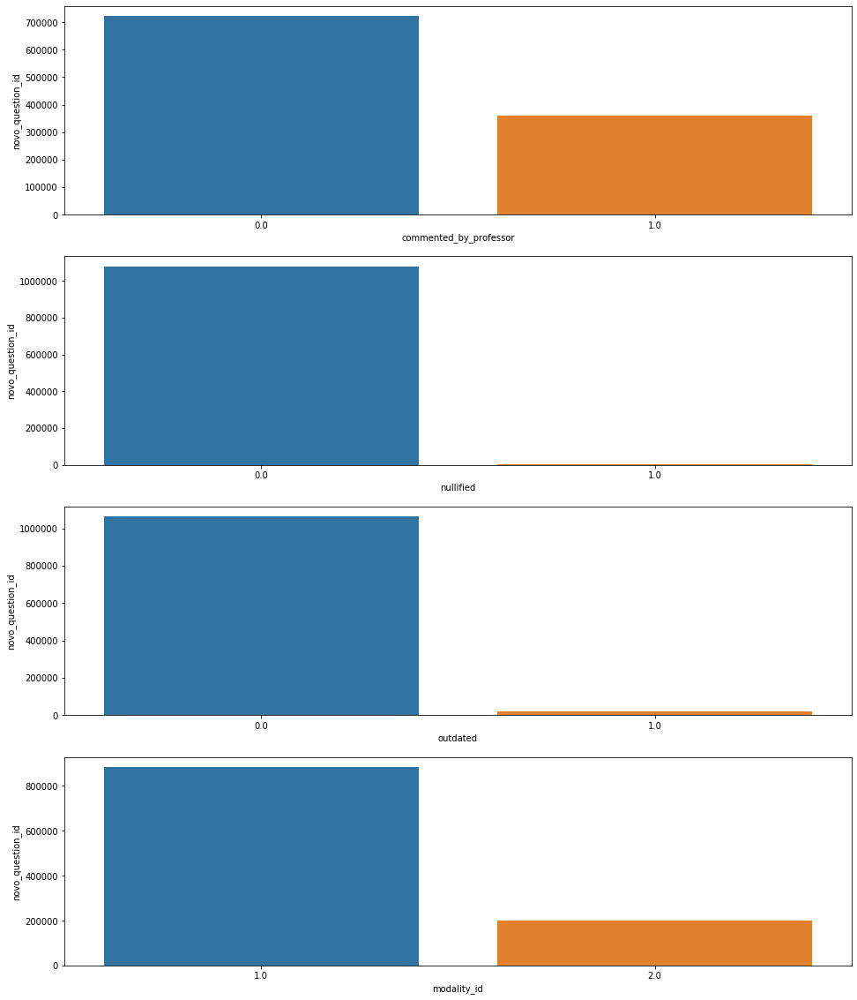

In [ ]:
# Variaveis binarias

binary_columns = ["commented_by_professor","nullified","outdated","modality_id"]

fig, ax = plt.subplots(len(binary_columns),1,figsize=(16,5*len(binary_columns)))

for i in range(0,len(binary_columns)):
  coluna = questions_df.groupby(binary_columns[i]).novo_question_id.count().to_frame().reset_index()
  sns.barplot(data = coluna,x=binary_columns[i], y = "novo_question_id" ,ax=ax[i])
fig.show()

Insigths:


*   Quase não existem questões anuladas ou datadas
*   Boa distribuição das questões comentadas
*   Maioria das questões são de multipla escolha





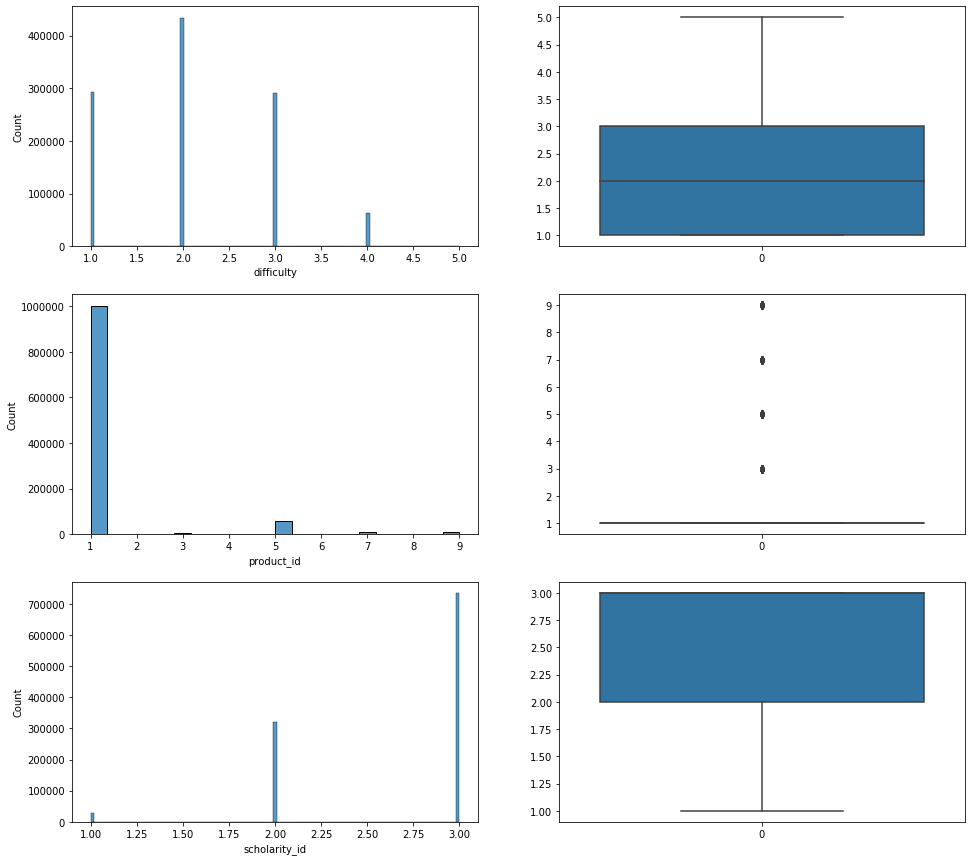

In [ ]:
# Variaveis discretas com varias classes

discrete_columns = ["difficulty","product_id","scholarity_id"]

fig, ax = plt.subplots(len(discrete_columns),2,figsize=(16,5*len(discrete_columns)))

for i in range(0,len(discrete_columns)):
  coluna = questions_df[discrete_columns[i]]
  sns.histplot(data = coluna, ax=ax[i,0])
  sns.boxplot(data = coluna, ax=ax[i,1])

fig.show()

Insights:
*   Boa distribuição da dificuldade das questões, com pequena assimetria para questões mais faceis.
*   Quase a totalidade das questões são do produto 1
*   Poucas questões de escolaridade 1: Concentração em escolaridade 2 e 3.





In [ ]:
questions_df.loc[:,['acertou','nullified']].groupby('nullified').sum()

,acertou
nullified,
0.0,671653
1.0,1881


In [ ]:
diff_w1 = questions_df.loc[(questions_df.outdated==1.0), 'difficulty']*1.5
diff_w2 = questions_df.loc[(questions_df.nullified == 1.0), 'difficulty']*2

questions_df.loc[diff_w1.index,'difficulty'] = diff_w1
questions_df.loc[diff_w2.index,'difficulty'] = diff_w2

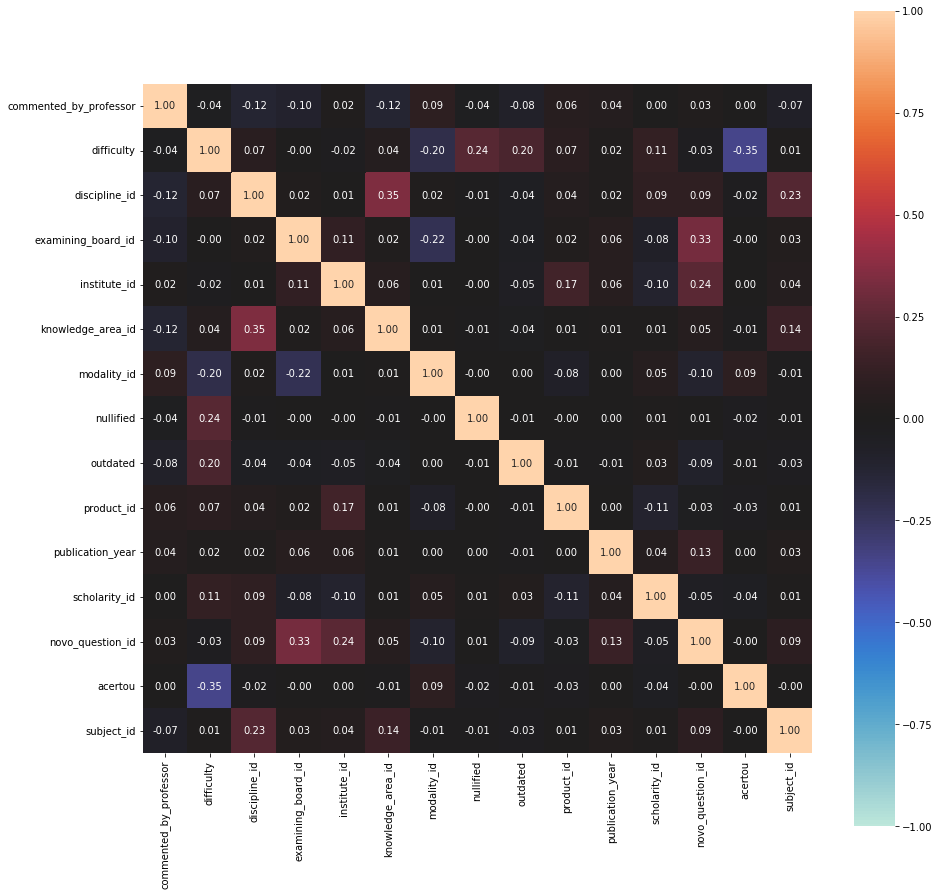

In [ ]:
# Correlação linear entre as variaveis categoricas

associations(questions_df.loc[:,questions_df.columns[2:]],figsize=(15, 15))
fig.show()

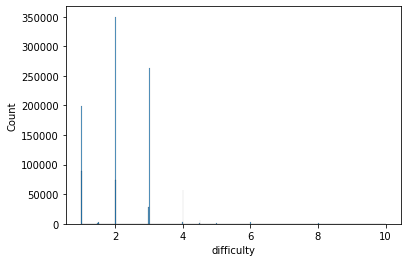

In [ ]:
# Análise entre dificuldade e modalidade

modality_unique = questions_df['modality_id'].unique()[:-1]

#fig, ax = plt.subplots(2,1,figsize=(16,5*len(discrete_columns)))


diff1 = questions_df.loc[questions_df.modality_id == modality_unique[0],'difficulty']
sns.histplot(data = diff1)
diff2 = questions_df.loc[questions_df.modality_id == modality_unique[1],'difficulty']
sns.histplot(data = diff2)



In [ ]:
questions_df[['nullified','acertou']].groupby('acertou').nullified.sum()

acertou
0    2431.0
1    1881.0
Name: nullified, dtype: float64

## 2.3 -) Clusterização

In [ ]:
# Flags para diminuir tempo de execução quando executar tudo
flag_questoes = False
flag_alunos = False

### 2.3.1-) Questões

In [ ]:
# Variaveis que definem a questão

cluster_questions_cols = ['novo_question_id','difficulty',"examining_board_id", "knowledge_area_id"]

questions_cluster_df = dataset.loc[:,cluster_questions_cols]
questions_cluster_df.drop_duplicates(subset=['novo_question_id'],inplace=True)
questions_cluster_df.dropna(inplace=True)
questions_cluster_df.head()

,novo_question_id,difficulty,examining_board_id,knowledge_area_id
0,489400,4.0,73.0,13.0
1,489399,4.0,73.0,13.0
2,489398,3.0,73.0,13.0
3,489397,4.0,73.0,13.0
4,489396,3.0,73.0,13.0


In [ ]:
questions_cluster_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 497034 entries, 0 to 1999999
Data columns (total 4 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   novo_question_id    497034 non-null  int64  
 1   difficulty          497034 non-null  float64
 2   examining_board_id  497034 non-null  float64
 3   knowledge_area_id   497034 non-null  float64
dtypes: float64(3), int64(1)
memory usage: 19.0 MB


In [ ]:
#Exploração gráfica e tais variáveis

fig = make_subplots(rows=3, cols=1,subplot_titles=tuple(cluster_questions_cols[1:]))

fig.add_trace(go.Box(x = questions_cluster_df[cluster_questions_cols[1]]),row=1,col=1)
fig.add_trace(go.Box(x = questions_cluster_df[cluster_questions_cols[2]]),row=2,col=1)
fig.add_trace(go.Box(x = questions_cluster_df[cluster_questions_cols[3]]),row=3,col=1)
fig.update_layout(height=600, width=800,showlegend=False)
fig.show()

Insights:


*   Dificuldade da Questão: Metade da questões são de dificuldade 2 ou menor, poucas de dificuldade 5.
*   Banca examinadora da questão: Do total de 3800 bancas, apenas 620 examinão 75% da questões.
*   Area de conhecimento: Grande concentração das questões, 75%, em 15 áreas.





In [ ]:
# Normalização das variaveis escolhidas

cluster_questions_vars = cluster_questions_cols[1:]

questions_scl = StandardScaler()
questions_cluster_df.loc[:,cluster_questions_vars] = questions_scl.fit_transform(questions_cluster_df.loc[:,cluster_questions_vars])

questions_cluster_df.head()

,novo_question_id,difficulty,examining_board_id,knowledge_area_id
0,489400,2.146988,-0.416693,-0.206223
1,489399,2.146988,-0.416693,-0.206223
2,489398,1.009771,-0.416693,-0.206223
3,489397,2.146988,-0.416693,-0.206223
4,489396,1.009771,-0.416693,-0.206223


In [ ]:
# Regra do cotovelo
if flag_questoes:
  n_clusters = np.arange(1,15,1)
  cluster_analise = pd.DataFrame(columns = ['n_cluster','inertia'])
  cluster_analise['n_cluster'] = n_clusters
  inertia_list = []
  for nc in n_clusters:
    X = questions_cluster_df.loc[:,cluster_questions_vars].values
    kmeans = KMeans(n_clusters=nc,random_state=0).fit(X)
    inertia_list.append(kmeans.inertia_)
  cluster_analise['inertia'] = np.array(inertia_list)

  fig = px.line(cluster_analise, x='n_cluster', y='inertia', markers=True)
  fig.show()


In [ ]:
# Escolhida a quantidade de clusters, associar cada questão ao seu cluster

number_clusters = 4
X = questions_cluster_df.loc[:,cluster_questions_vars].values
kmeans_question = KMeans(n_clusters=number_clusters,random_state=0).fit(X)

questions_cluster_df['cluster'] = kmeans_question.labels_
questions_cluster_df.loc[:,cluster_questions_vars] = questions_scl.inverse_transform(questions_cluster_df.loc[:,cluster_questions_vars])

questions_cluster_df.head()

,novo_question_id,difficulty,examining_board_id,knowledge_area_id,cluster
0,489400,4.0,73.0,13.0,3
1,489399,4.0,73.0,13.0,3
2,489398,3.0,73.0,13.0,3
3,489397,4.0,73.0,13.0,3
4,489396,3.0,73.0,13.0,3


In [ ]:
# Volumetria dos clusters

questoes_cluster = questions_cluster_df.groupby('cluster').novo_question_id.count()
fig = px.bar(questoes_cluster)
fig.show()

In [ ]:
# Análise dos clusters nas variaveis definidas

for i in range(len(cluster_questions_vars)):
  list_traces=[]
  for nc in range(number_clusters):
    trace = go.Box(x = questions_cluster_df[questions_cluster_df.cluster==nc][cluster_questions_vars[i]])
    list_traces.append(trace)
  fig = go.Figure(list_traces)
  fig.update_layout(width=800,height=600, title_text=cluster_questions_vars[i],showlegend=False)
  fig.show()


### 2.3.2-) Alunos

In [ ]:
# Variaveis que definem o aluno

cluster_alunos_cols = ['novo_user_id',"cidades", "carreiras"]

aluno_cluster_df = alunos_df.loc[:,cluster_alunos_cols]

aluno_cluster_df['cidades'],_ = pd.factorize(aluno_cluster_df['cidades'].values)
aluno_cluster_df['carreiras'],_ = pd.factorize(aluno_cluster_df['carreiras'].values)

aluno_cluster_df.dropna(inplace=True)
aluno_cluster_df.head()

,novo_user_id,cidades,carreiras
0,1,0,0
1,2,1,0
2,3,2,1
3,4,3,2
4,5,4,3


In [ ]:
aluno_cluster_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20000 entries, 0 to 19999
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   novo_user_id  20000 non-null  int64
 1   cidades       20000 non-null  int64
 2   carreiras     20000 non-null  int64
dtypes: int64(3)
memory usage: 625.0 KB


In [ ]:
#Exploração gráfica de tais variáveis

fig = make_subplots(rows=2, cols=1,subplot_titles=tuple(cluster_alunos_cols[1:]))

fig.add_trace(go.Box(x = aluno_cluster_df[cluster_alunos_cols[1]]),row=1,col=1)
fig.add_trace(go.Box(x = aluno_cluster_df[cluster_alunos_cols[2]]),row=2,col=1)
#fig.add_trace(go.Box(x = aluno_cluster_df[cluster_alunos_cols[3]]),row=3,col=1)
fig.update_layout(height=600, width=800,showlegend=False)
fig.show()

Insigts:

*   Elevada concentração de dados em device_type(alta cardinalidade)



In [ ]:
# Normalização das variaveis escolhidas

cluster_alunos_vars = cluster_alunos_cols[1:]

aluno_scl = StandardScaler()
aluno_cluster_df.loc[:,cluster_alunos_vars] = aluno_scl.fit_transform(aluno_cluster_df.loc[:,cluster_alunos_vars])

aluno_cluster_df.head()

,novo_user_id,cidades,carreiras
0,1,-0.896713,-1.680215
1,2,-0.691939,-1.680215
2,3,-0.487166,-1.286800
3,4,-0.282393,-0.893386
4,5,-0.077619,-0.499971


In [ ]:
# Regra do cotovelo
if flag_alunos:
  n_clusters = np.arange(1,15,1)
  cluster_analise = pd.DataFrame(columns = ['n_cluster','inertia'])
  cluster_analise['n_cluster'] = n_clusters
  inertia_list = []
  for nc in n_clusters:
    X = aluno_cluster_df.loc[:,cluster_alunos_vars].values
    kmeans = KMeans(n_clusters=nc,random_state=0).fit(X)
    inertia_list.append(kmeans.inertia_)
  cluster_analise['inertia'] = np.array(inertia_list)

  fig = px.line(cluster_analise, x='n_cluster', y='inertia', markers=True)
  fig.show()


In [ ]:
# Escolhida a quantidade de clusters, associar cada aluno ao seu cluster

number_clusters = 3
X = aluno_cluster_df.loc[:,cluster_alunos_vars].values
kmeans_aluno = KMeans(n_clusters=number_clusters,random_state=0).fit(X)

aluno_cluster_df['cluster'] = kmeans_aluno.labels_
aluno_cluster_df.loc[:,cluster_alunos_vars] = aluno_scl.inverse_transform(aluno_cluster_df.loc[:,cluster_alunos_vars])

aluno_cluster_df.head()

,novo_user_id,cidades,carreiras,cluster
0,1,0.0,0.0,2
1,2,1.0,0.0,2
2,3,2.0,1.0,2
3,4,3.0,2.0,2
4,5,4.0,3.0,2


In [ ]:
# Volumetria dos clusters

alunos_cluster = aluno_cluster_df.groupby('cluster').novo_user_id.count()
fig = px.bar(alunos_cluster)
fig.show()

In [ ]:
# Análise dos clusters nas variaveis definidas

for i in range(len(cluster_alunos_vars)):
  list_traces=[]
  for nc in range(number_clusters):
    trace = go.Box(x = aluno_cluster_df[aluno_cluster_df.cluster==nc][cluster_alunos_vars[i]])
    list_traces.append(trace)
  fig = go.Figure(list_traces)
  fig.update_layout(width=800,height=600, title_text=cluster_alunos_vars[i],showlegend=False)
  fig.show()


## 2.4-) Temporalidade das questões dos alunos

In [ ]:
# Criação do dataset com apenas as variaveis importantes

ts_df = dataset.loc[:,['novo_user_id','acertou','novo_question_id']].merge(right= questions_cluster_df.loc[:,['cluster','novo_question_id']],on='novo_question_id',how='left')
ts_df = ts_df.merge(right= aluno_cluster_df.loc[:,['cluster','novo_user_id']],on='novo_user_id',how='left')
ts_df.drop(columns=['novo_question_id'],inplace=True)
ts_df.rename(columns={'cluster_x':'cluster_question','cluster_y':'cluster_aluno'},inplace=True)
ts_df

,novo_user_id,acertou,cluster_question,cluster_aluno
0,1,0,3.0,2
1,1,0,3.0,2
2,1,1,3.0,2
3,1,0,3.0,2
4,1,1,3.0,2
...,...,...,...,...
1999995,20000,1,0.0,1
1999996,20000,1,0.0,1
1999997,20000,0,0.0,1
1999998,20000,0,3.0,1


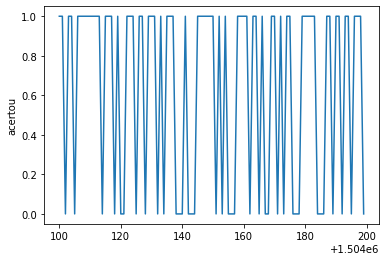

In [ ]:
# Análise das time-series de alunos aleatorios

id_aluno = np.random.randint(1,20000)

ts_aluno_rand = ts_df[(ts_df.novo_user_id == id_aluno)]

sns.lineplot(data = ts_aluno_rand['acertou'])

Insights:
*   Não existe tendência na ts 
*   Não apresenta ruido
*   Sazonalidade é o unico fator a ser estudado 





In [ ]:
# Calculando a autocorrelação para cada aluno em agrupando por cluster
corr_df =  {}
for c in ts_df.cluster_aluno.unique():
  ts_cluster = ts_df[ts_df.cluster_aluno == c].reset_index().loc[:,'acertou']
  size_cluster = (int(len(ts_cluster)/100))
  corr_cluster = np.zeros(shape=(size_cluster,100))
  for i in range(size_cluster):
    corr_i = sm.tsa.acf(ts_cluster.iloc[100*i:100*(i+1)], nlags = 100)
    corr_cluster[i,:] = corr_i
  corr_df[c] = corr_cluster


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:671: FutureWarning:

fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:677: RuntimeWarning:

invalid value encountered in true_divide



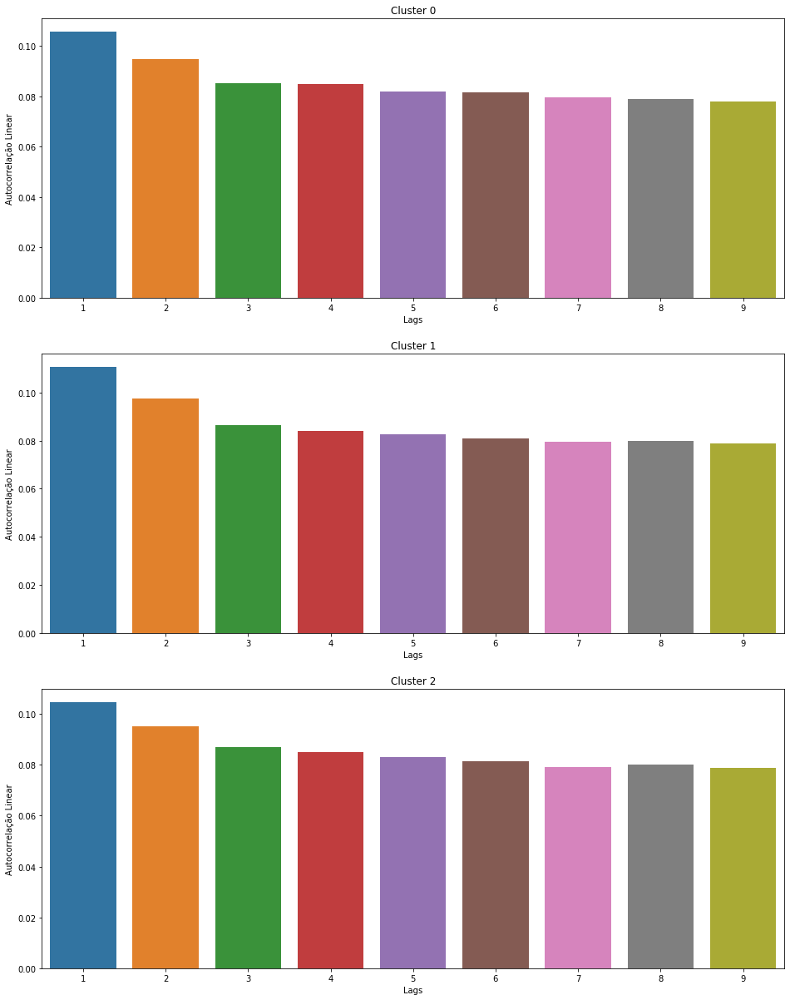

In [ ]:
# Distribuição das autocorrelações

clusters = corr_df.keys()
fig, ax = plt.subplots(len(clusters),1,figsize=(16,7*len(discrete_columns)))
count=0
for c in range(0,len(clusters)):
  data = pd.DataFrame(corr_df[c]).abs().describe().loc['mean',:].sort_values(ascending=False).head(10)
  sns.barplot(x = data.index[1:],y=data.values[1:],ax=ax[count])
  ax[count].set_xlabel('Lags')
  ax[count].set_ylabel('Autocorrelação Linear')
  ax[count].set_title(f'Cluster {c}')
  count+=1
fig.show()

Insight: Na média, em todos os cluster, as questões feitas mais recentemente tem maior impacto no resultado da proxima questão.

obs: Alta variação nas correlações de todos os lags, em todos os clusters.

# 3-) Engenharia de Variáveis

In [ ]:
# Criando as variaveis com delay
def make_lags(df,list_features,n_lags):
  """Faz o shift de uma feature ou lista de features """
  """Parâmetros: df -> dataframe ; list_features -> lista de features para se fazer os diffs ; n_diff ->  o a diferença de tempo """
  col_features=[]
  for n in n_lags:
      for f in list_features:
          name_feature = f+"_lag"+str(n) 
          df[name_feature] = df[f].shift(n)
          col_features.append(name_feature)
  return df[col_features]

In [ ]:
# Inserção do cluster nas questões
vars_df_questions = dataset.merge(right=questions_cluster_df[['novo_question_id','cluster']],
                                            how='left', on = 'novo_question_id')
vars_df_questions['cluster_question'] = vars_df_questions['cluster'].astype('str')
vars_df_questions.drop(columns=['cluster'],inplace=True)

vars_df = vars_df_questions.merge(right=aluno_cluster_df[['novo_user_id','cluster']],
                                            how='left', on = 'novo_user_id')
vars_df['cluster_aluno'] = vars_df['cluster'].astype('str')
vars_df.drop(columns=['cluster'],inplace=True)

vars_df.head()

,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,gp:college type,...,modality_id,nullified,outdated,product_id,publication_year,right_answer,scholarity_id,novo_question_id,cluster_question,cluster_aluno
0,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,1.0,0.0,0.0,1.0,2022.0,A,2.0,489400,3.0,2
1,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,1.0,0.0,0.0,1.0,2022.0,C,2.0,489399,3.0,2
2,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,1.0,0.0,0.0,1.0,2022.0,D,2.0,489398,3.0,2
3,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,1.0,0.0,0.0,1.0,2022.0,A,2.0,489397,3.0,2
4,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,1.0,0.0,0.0,1.0,2022.0,E,2.0,489396,3.0,2


In [ ]:

# Inserindo as variaveis importates do aluno_df

vars_df = vars_df.merge(right=alunos_df.loc[:,['novo_user_id','taxa_acerto','diff_1.0','diff_2.0','diff_3.0','diff_4.0','diff_5.0']],on='novo_user_id',how='left')
vars_df

,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,gp:college type,...,scholarity_id,novo_question_id,cluster_question,cluster_aluno,taxa_acerto,diff_1.0,diff_2.0,diff_3.0,diff_4.0,diff_5.0
0,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,2.0,489400,3.0,2,0.501976,13.0,33.0,42.0,12.0,0.0
1,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,2.0,489399,3.0,2,0.501976,13.0,33.0,42.0,12.0,0.0
2,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,2.0,489398,3.0,2,0.501976,13.0,33.0,42.0,12.0,0.0
3,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,2.0,489397,3.0,2,0.501976,13.0,33.0,42.0,12.0,0.0
4,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,2.0,489396,3.0,2,0.501976,13.0,33.0,42.0,12.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999995,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,3.0,433505,0.0,1,0.421687,16.0,32.0,39.0,13.0,0.0
1999996,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,3.0,432606,0.0,1,0.421687,16.0,32.0,39.0,13.0,0.0
1999997,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,3.0,432605,0.0,1,0.421687,16.0,32.0,39.0,13.0,0.0
1999998,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,3.0,430934,3.0,1,0.421687,16.0,32.0,39.0,13.0,0.0


In [ ]:
# Inserção do One hot encoding nas carreiras

carreiras_hot_encoding = pd.get_dummies(carreiras).groupby(carreiras.index).sum()
carreiras_hot_encoding.drop(carreiras_hot_encoding.index[-1],inplace=True)
vars_df[carreiras_hot_encoding.columns] = carreiras_hot_encoding

# One hot encoding do dataframe das variaveis
discrete_columns = ["product_id","cluster_question",'cluster_aluno']
vars_df = pd.get_dummies(vars_df,columns=discrete_columns,drop_first=True)
#vars_df['cluster_aluno'] = vars_df['cluster_aluno'].astype(int)
vars_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000000 entries, 0 to 1999999
Data columns (total 55 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   novo_user_id            int64  
 1   city                    object 
 2   country                 object 
 3   device                  object 
 4   device_type             object 
 5   os                      object 
 6   platform                object 
 7   region                  object 
 8   gp:carrers              object 
 9   gp:college type         object 
 10  gp:degree course        object 
 11  gp:previous experience  object 
 12  gp:school type          object 
 13  gp:segment              object 
 14  gp:source_project       object 
 15  acertou                 int64  
 16  created_at              object 
 17  row                     int64  
 18  commented_by_professor  float64
 19  difficulty              float64
 20  discipline_id           float64
 21  examining_board_id      float64

In [ ]:
lags = make_lags(vars_df,['difficulty'],[1,2,3,4,5,6,7,8,9,10])
vars_df[lags.columns] = lags
vars_df

,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,gp:college type,...,difficulty_lag1,difficulty_lag2,difficulty_lag3,difficulty_lag4,difficulty_lag5,difficulty_lag6,difficulty_lag7,difficulty_lag8,difficulty_lag9,difficulty_lag10
0,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,4.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,3.0,4.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,4.0,3.0,4.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999995,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,4.0,3.0,3.0,3.0,2.0,2.0,1.0,1.0,3.0,1.0
1999996,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,2.0,4.0,3.0,3.0,3.0,2.0,2.0,1.0,1.0,3.0
1999997,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,1.0,2.0,4.0,3.0,3.0,3.0,2.0,2.0,1.0,1.0
1999998,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,2.0,1.0,2.0,4.0,3.0,3.0,3.0,2.0,2.0,1.0


In [ ]:
# Transformando as cidades em variavel com one hot encoding

cities_dummies = pd.get_dummies(alunos_df.loc[:,'city'])
cities_dummies['taxa_acerto'] = alunos_df['taxa_acerto']
corr_cities = cities_dummies.corr()

In [ ]:
# Filtrando cidades com alta correlação com a taxa de acerto
corr_cities.taxa_acerto.to_frame().sort_values(by='taxa_acerto',ascending=False).head(10)
filter_cities = ['Niterói','Sao Joao de Meriti','Ouvidor','Curitiba','Patos','Petrolina']

# Gerando a nova feature da cidade

vars_df.loc[:,'filter_city'] = vars_df.city.isin(filter_cities)

NameError: ignored

In [ ]:
# Preenchimento dos valores faltante
vars_df.loc[(vars_df.difficulty.isna()) & (vars_df.modality_id==1.0),'difficulty'] = diff1.mean()
vars_df.loc[(vars_df.difficulty.isna()) & (vars_df.modality_id==2.0),'difficulty'] = diff2.mean()

# 4-) Seleção de variaveis

In [ ]:
vars_df.columns

Index(['novo_user_id', 'city', 'country', 'device', 'device_type', 'os',
       'platform', 'region', 'gp:carrers', 'gp:college type',
       'gp:degree course', 'gp:previous experience', 'gp:school type',
       'gp:segment', 'gp:source_project', 'acertou', 'created_at', 'row',
       'commented_by_professor', 'difficulty', 'discipline_id',
       'examining_board_id', 'institute_id', 'knowledge_area_id',
       'modality_id', 'nullified', 'outdated', 'product_id',
       'publication_year', 'right_answer', 'scholarity_id', 'novo_question_id',
       'cluster_question', 'cluster_aluno', 'taxa_acerto', 'diff_1.0',
       'diff_2.0', 'diff_3.0', 'diff_4.0', 'diff_5.0', 'difficulty_lag1',
       'difficulty_lag2', 'difficulty_lag3', 'difficulty_lag4',
       'difficulty_lag5', 'difficulty_lag6', 'difficulty_lag7',
       'difficulty_lag8', 'difficulty_lag9', 'difficulty_lag10'],
      dtype='object')

In [ ]:
selected_columns =  ['difficulty_lag1', 'difficulty_lag2', 'difficulty_lag3',
       'difficulty_lag4', 'difficulty_lag5', 'difficulty_lag6',
       'difficulty_lag7', 'difficulty_lag8', 'difficulty_lag9',
       'difficulty_lag10','diff_1.0','diff_2.0', 'diff_3.0', 'diff_4.0', 'diff_5.0',
       'taxa_acerto','difficulty','acertou']

df = vars_df[selected_columns]
df.describe()

,difficulty_lag1,difficulty_lag2,difficulty_lag3,difficulty_lag4,difficulty_lag5,difficulty_lag6,difficulty_lag7,difficulty_lag8,difficulty_lag9,difficulty_lag10,diff_1.0,diff_2.0,diff_3.0,diff_4.0,diff_5.0,taxa_acerto,difficulty,acertou
count,1.997370e+06,1.997369e+06,1.997368e+06,1.997367e+06,1.997366e+06,1.997365e+06,1.997364e+06,1.997363e+06,1.997362e+06,1.997361e+06,2.000000e+06,2.000000e+06,2.000000e+06,2.000000e+06,2.000000e+06,2.000000e+06,1.999822e+06,2.000000e+06
mean,2.000065e+00,2.000065e+00,2.000065e+00,2.000065e+00,2.000065e+00,2.000064e+00,2.000064e+00,2.000063e+00,2.000063e+00,2.000063e+00,3.202505e+01,4.021300e+01,2.329175e+01,4.276400e+00,6.235000e-02,5.963248e-01,2.000270e+00,6.542805e-01
std,8.548663e-01,8.548662e-01,8.548664e-01,8.548663e-01,8.548666e-01,8.548656e-01,8.548655e-01,8.548654e-01,8.548654e-01,8.548656e-01,1.436921e+01,7.966233e+00,1.081555e+01,4.128996e+00,3.771771e-01,1.277132e-01,8.543842e-01,4.756024e-01
min,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.018519e-01,1.000000e+00,0.000000e+00
25%,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,2.100000e+01,3.500000e+01,1.500000e+01,1.000000e+00,0.000000e+00,5.104059e-01,1.000000e+00,0.000000e+00
50%,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,3.100000e+01,4.000000e+01,2.200000e+01,3.000000e+00,0.000000e+00,5.974973e-01,2.000000e+00,1.000000e+00
75%,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,4.200000e+01,4.500000e+01,3.000000e+01,6.000000e+00,0.000000e+00,6.834171e-01,3.000000e+00,1.000000e+00
max,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,9.800000e+01,8.500000e+01,9.200000e+01,7.500000e+01,1.400000e+01,1.000000e+00,5.000000e+00,1.000000e+00


In [ ]:

corr_matrix = df.corr()
px.imshow(corr_matrix)

In [ ]:
selected_vars = ['taxa_acerto','difficulty','diff_1.0','difficulty_lag1','acertou']
df = df.loc[:,selected_vars]
df.dropna(inplace=True)
df.describe()


,taxa_acerto,difficulty,diff_1.0,difficulty_lag1,acertou
count,1.997255e+06,1.997255e+06,1.997255e+06,1.997255e+06,1.997255e+06
mean,5.963411e-01,2.000307e+00,3.202403e+01,2.000063e+00,6.542615e-01
std,1.277244e-01,8.545610e-01,1.437075e+01,8.548683e-01,4.756086e-01
min,1.018519e-01,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00
25%,5.104167e-01,1.000000e+00,2.100000e+01,1.000000e+00,0.000000e+00
50%,5.975104e-01,2.000000e+00,3.100000e+01,2.000000e+00,1.000000e+00
75%,6.834532e-01,3.000000e+00,4.200000e+01,3.000000e+00,1.000000e+00
max,1.000000e+00,5.000000e+00,9.800000e+01,5.000000e+00,1.000000e+00


# 5-) Modelo

In [ ]:
X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values
print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

X shape: (1997255, 4)
y shape: (1997255,)


In [ ]:
X_train,X_val,y_train,y_val = train_test_split(X,y,test_size=0.33)

print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_val shape: {X_val.shape}')
print(f'y_val shape: {y_val.shape}')

X_train shape: (1338160, 4)
y_train shape: (1338160,)
X_val shape: (659095, 4)
y_val shape: (659095,)


### 5.1-) Regessão Logistica

In [ ]:
reglog_scaler = StandardScaler()
reglog_scaler.fit(X_train)
X_train_norm = reglog_scaler.transform(X_train)
X_val_norm = reglog_scaler.transform(X_val)

In [ ]:
reglog = LogisticRegression()
params_reglog = {'C':np.arange(0.2,1.5,0.1)}
clf_reglog = GridSearchCV(reglog, params_reglog,cv = 7)
clf_reglog.fit(X_train_norm,y_train)

GridSearchCV(cv=7, estimator=LogisticRegression(),
             param_grid={'C': array([0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3, 1.4])})

In [ ]:
best_reglog = LogisticRegression(C = clf_reglog.best_params_['C'])
#best_reglog = LogisticRegression()
best_reglog.fit(X_train_norm,y_train)

reglog_pred = best_reglog.predict(X_val_norm)

print(f'Score da base de treino: {best_reglog.score(X_train_norm,y_train):.3f}')
print(f'Score da base de validação: {best_reglog.score(X_val_norm,y_val):.3f}')
print(classification_report(y_val,reglog_pred))
print(confusion_matrix(y_val,reglog_pred))

Score da base de treino: 0.708
Score da base de validação: 0.709
              precision    recall  f1-score   support

           0       0.63      0.39      0.48    227806
           1       0.73      0.88      0.80    431289

    accuracy                           0.71    659095
   macro avg       0.68      0.63      0.64    659095
weighted avg       0.69      0.71      0.69    659095

[[ 89012 138794]
 [ 53315 377974]]


## 5.2-) Random Forest

In [ ]:
rf = RandomForestClassifier(20)

rf.fit(X_train,y_train)

print(f'Score da base de treino: {rf.score(X_train,y_train):.3f}')
print(f'Score da base de validação: {rf.score(X_val,y_val):.3f}')

Score da base de treino: 0.723
Score da base de validação: 0.690


In [ ]:
rf_pred = rf.predict(X_val)

print(classification_report(y_val,rf_pred))
print(confusion_matrix(y_val,rf_pred))

              precision    recall  f1-score   support

           0       0.57      0.39      0.47    222579
           1       0.73      0.85      0.78    423907

    accuracy                           0.69    646486
   macro avg       0.65      0.62      0.62    646486
weighted avg       0.67      0.69      0.67    646486

[[ 87294 135285]
 [ 65315 358592]]


## 5.3-) Rede Neural

In [ ]:
RNN = MLPClassifier(25)

RNN.fit(X_train_norm,y_train)

print(f'Score da base de treino: {RNN.score(X_train_norm,y_train):.3f}')
print(f'Score da base de validação: {RNN.score(X_val_norm,y_val):.3f}')


Score da base de treino: 0.709
Score da base de validação: 0.709


In [ ]:
rnn_pred = RNN.predict(X_val_norm)
print(classification_report(y_val,rnn_pred))
print(confusion_matrix(y_val,rnn_pred))

              precision    recall  f1-score   support

           0       0.61      0.43      0.50    222579
           1       0.74      0.86      0.79    423907

    accuracy                           0.71    646486
   macro avg       0.68      0.64      0.65    646486
weighted avg       0.70      0.71      0.69    646486

[[ 95024 127555]
 [ 60431 363476]]


# 6-) Submisão

In [ ]:
# Leitura do dataset de teste

teste_df = pd.read_csv(path+"/Submit.csv",sep=';')
display(teste_df)
display(teste_df.describe())

,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,gp:college type,...,institute_id,knowledge_area_id,modality_id,nullified,outdated,product_id,publication_year,right_answer,scholarity_id,novo_question_id
0,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,6289.0,13.0,1.0,0.0,0.0,1.0,2021.0,B,3.0,484766
1,2,São Paulo,Brazil,Windows,Windows,Chrome 104,Web,Sao Paulo,Tribunal,NaN,...,2994.0,53.0,1.0,0.0,0.0,1.0,2016.0,C,3.0,159545
2,3,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.5,iOS,Minas Gerais,"Controle e Gestão, Outras, Administrativa",NaN,...,20.0,14.0,1.0,0.0,0.0,1.0,2017.0,C,3.0,233145
3,4,Recife,Brazil,Windows,Windows,Chrome 104,Web,Pernambuco,"Fiscal, Tribunal, Policial, Legislativa, Jurídica",NaN,...,36.0,9.0,2.0,0.0,0.0,1.0,2014.0,C,3.0,108082
4,5,Brasília,Brazil,Windows,Windows,Chrome 99,Web,Federal District,Bancária,NaN,...,6001.0,13.0,1.0,0.0,0.0,1.0,2015.0,A,3.0,151695
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19996,Brasília,Brazil,Windows,Windows,Chrome 104,Web,Federal District,Policial,NaN,...,5757.0,9.0,1.0,0.0,0.0,1.0,2022.0,D,3.0,495716
19996,19997,São Luís,Brazil,Samsung Phone,Samsung Galaxy J4 Core,android 8.1.0,Android,Maranhao,Policial,NaN,...,5783.0,9.0,1.0,0.0,0.0,5.0,2021.0,A,2.0,471278
19997,19998,Salvador,Brazil,Windows,Windows,Chrome 104,Web,Bahia,Administrativa,NaN,...,2791.0,2.0,1.0,0.0,0.0,1.0,2021.0,E,2.0,441819
19998,19999,NaN,Brazil,Samsung Phone,Samsung Galaxy M51,android 12,Android,Alagoas,Administrativa,NaN,...,6453.0,2.0,1.0,0.0,0.0,1.0,2021.0,A,2.0,443217


,novo_user_id,acertou,row,commented_by_professor,difficulty,discipline_id,examining_board_id,institute_id,knowledge_area_id,modality_id,nullified,outdated,product_id,publication_year,scholarity_id,novo_question_id
count,20000.000000,0.0,20000.0,19998.000000,19971.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,20000.000000
mean,10000.500000,NaN,101.0,0.550055,1.986380,73.479248,185.471997,4566.410591,15.827583,1.261176,0.002200,0.014751,1.371137,2016.806581,2.637864,275686.744000
std,5773.647028,NaN,0.0,0.497501,0.855753,139.629803,344.021431,2908.245488,29.957755,0.439287,0.046856,0.120560,1.281997,3.827439,0.522218,137444.806864
min,1.000000,NaN,101.0,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,2000.000000,1.000000,16.000000
25%,5000.750000,NaN,101.0,0.000000,1.000000,3.000000,2.000000,925.000000,9.000000,1.000000,0.000000,0.000000,1.000000,2015.000000,2.000000,171023.750000
50%,10000.500000,NaN,101.0,1.000000,2.000000,9.000000,63.000000,5782.000000,9.000000,1.000000,0.000000,0.000000,1.000000,2018.000000,3.000000,277156.500000
75%,15000.250000,NaN,101.0,1.000000,3.000000,56.000000,211.000000,6270.000000,14.000000,2.000000,0.000000,0.000000,1.000000,2019.000000,3.000000,391992.500000
max,20000.000000,NaN,101.0,1.000000,5.000000,593.000000,3712.000000,10265.000000,324.000000,2.000000,1.000000,1.000000,9.000000,2022.000000,3.000000,500594.000000


## 6.1-) EDA

In [ ]:


# Inserindo a média da questão

teste_df.loc[(teste_df.difficulty.isna()) & (teste_df.modality_id==1.0),'difficulty'] = diff1.mean()
teste_df.loc[(teste_df.difficulty.isna()) & (teste_df.modality_id==2.0),'difficulty'] = diff2.mean()

In [ ]:
teste_df.nullified.sum()

44.0

## 6.2-) Inserção das variaveis importantes

In [ ]:
# Inserção da qtd de questões da dificuldade 1
teste_df['diff_1.0'] = alunos_df.loc[:,'diff_1.0']

# Iserção da taxa de acerto para cada aluno
teste_df['taxa_acerto'] = alunos_df.loc[:,'taxa_acerto']

# Inserção da difficulty_lag1
teste_df['difficulty_lag1'] = vars_df.loc[:,['difficulty_lag1','novo_user_id']].groupby('novo_user_id').agg('last')

teste_df

,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,gp:college type,...,nullified,outdated,product_id,publication_year,right_answer,scholarity_id,novo_question_id,diff_1.0,taxa_acerto,difficulty_lag1
0,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,0.0,0.0,1.0,2021.0,B,3.0,484766,13.0,0.501976,NaN
1,2,São Paulo,Brazil,Windows,Windows,Chrome 104,Web,Sao Paulo,Tribunal,NaN,...,0.0,0.0,1.0,2016.0,C,3.0,159545,25.0,0.625616,3.0
2,3,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.5,iOS,Minas Gerais,"Controle e Gestão, Outras, Administrativa",NaN,...,0.0,0.0,1.0,2017.0,C,3.0,233145,36.0,0.735751,2.0
3,4,Recife,Brazil,Windows,Windows,Chrome 104,Web,Pernambuco,"Fiscal, Tribunal, Policial, Legislativa, Jurídica",NaN,...,0.0,0.0,1.0,2014.0,C,3.0,108082,63.0,0.773973,3.0
4,5,Brasília,Brazil,Windows,Windows,Chrome 99,Web,Federal District,Bancária,NaN,...,0.0,0.0,1.0,2015.0,A,3.0,151695,14.0,0.349020,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19996,Brasília,Brazil,Windows,Windows,Chrome 104,Web,Federal District,Policial,NaN,...,0.0,0.0,1.0,2022.0,D,3.0,495716,34.0,0.502392,3.0
19996,19997,São Luís,Brazil,Samsung Phone,Samsung Galaxy J4 Core,android 8.1.0,Android,Maranhao,Policial,NaN,...,0.0,0.0,5.0,2021.0,A,2.0,471278,9.0,0.475806,4.0
19997,19998,Salvador,Brazil,Windows,Windows,Chrome 104,Web,Bahia,Administrativa,NaN,...,0.0,0.0,1.0,2021.0,E,2.0,441819,22.0,0.640693,2.0
19998,19999,NaN,Brazil,Samsung Phone,Samsung Galaxy M51,android 12,Android,Alagoas,Administrativa,NaN,...,0.0,0.0,1.0,2021.0,A,2.0,443217,68.0,0.662162,1.0


In [ ]:
# Normalização dos dados para usar na regressão logistica
teste_df.fillna(method='backfill',inplace=True)
X = teste_df.loc[:,['taxa_acerto','difficulty','diff_1.0','difficulty_lag1']].values
X = reglog_scaler.transform(X)

# Predição dos valores
prediction = best_reglog.predict(X)

# Exportar csv com o resultado

submission  = pd.DataFrame(columns = ['acertou'])
submission['acertou'] = prediction
submission

,acertou
0,1
1,1
2,0
3,1
4,0
...,...
19995,1
19996,1
19997,1
19998,1


In [ ]:
# Exportar csv com o resultado
submission.to_csv('Submit.csv',header=False,index=False)

In [ ]:
# Exportando modelo
import pickle
pickle.dump(best_reglog, open('regressão_logistica', 'wb'))